'<h1 font-color='violet' align='center' style="font-family:'Courier New'">An Investigation On Road Accident<br> And<br>Severity in Seattle</h1>

<div align="">
  <img  width="1000" height="1000" src="https://static01.nyt.com/images/2015/09/25/multimedia/seattle-survivor/seattle-survivor-superJumbo.jpg">
</div>

'<h1 font-color='violet' align='center' style="font-family:'Courier New'">Business Problem</h1>
<div align='center' style="font-family:'Lucida Console'">
<p align='center'>The Seattle government is going to prevent avoidable car accidents by employing methods that alert drivers, health system, and police to remind them to be more careful in critical situations.<br>
In most cases, not paying enough attention during driving, abusing drugs and alcohol or driving at very high speed are the main causes of occurring accidents that can be prevented by enacting harsher regulations. Besides the aforementioned reasons, weather, visibility, or road conditions are the major uncontrollable factors that can be prevented by revealing hidden patterns in the data and announcing warning to the local government, police and drivers on the targeted roads.<br>
The target audience of the project is local Seattle government, police, rescue groups, and last but not least, car insurance institutes. The model and its results are going to provide some advice for the target audience to make insightful decisions for reducing the number of accidents and injuries for the city.
</p>
</div>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns 
import matplotlib.pyplot as plt 
import folium
from folium import Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
import tqdm
from sklearn.model_selection import train_test_split
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/capstone-car-accident-serveity/Data_Collisions.csv


'<h1 font-color='violet' align='center' style="font-family:'Courier New'">Data</h1>
<div align='center' style="font-family:'Lucida Console'">
<p align='center'>The data was collected by the Seattle Police Department and Accident Traffic Records Department from 2004 to present.
The data consists of 37 independent variables and 194,673 rows. The dependent variable, “SEVERITYCODE”, contains numbers that correspond to different levels of severity caused by an accident from 0 to 4.<br>
Severity codes are as follows:<br>
0: Little to no Probability (Clear Conditions)<br>
1: Very Low Probability — Chance or Property Damage<br>
2: Low Probability — Chance of Injury<br>
3: Mild Probability — Chance of Serious Injury<br>
4: High Probability — Chance of Fatality<br>
    <br>
 
Furthermore, because of the existence of null values in some records, the data needs to be preprocessed before any further processing.


</p>
</div>

In [2]:
data = pd.read_csv('/kaggle/input/capstone-car-accident-serveity/Data_Collisions.csv')
data.head()

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [3]:
data.columns
print(data.columns)
len(data.columns)

Index(['SEVERITYCODE', 'X', 'Y', 'OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO',
       'STATUS', 'ADDRTYPE', 'INTKEY', 'LOCATION', 'EXCEPTRSNCODE',
       'EXCEPTRSNDESC', 'SEVERITYCODE.1', 'SEVERITYDESC', 'COLLISIONTYPE',
       'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INCDATE',
       'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'SDOT_COLDESC',
       'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND',
       'PEDROWNOTGRNT', 'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE', 'ST_COLDESC',
       'SEGLANEKEY', 'CROSSWALKKEY', 'HITPARKEDCAR'],
      dtype='object')


38

In [4]:
data.describe()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,INTKEY,SEVERITYCODE.1,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,SDOT_COLCODE,SDOTCOLNUM,SEGLANEKEY,CROSSWALKKEY
count,194673.000000,189339.000000,189339.000000,194673.000000,194673.000000,194673.000000,65070.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,1.149360e+05,194673.000000,1.946730e+05
mean,1.298901,-122.330518,47.619543,108479.364930,141091.456350,141298.811381,37558.450576,1.298901,2.444427,0.037139,0.028391,1.920780,13.867768,7.972521e+06,269.401114,9.782452e+03
std,0.457778,0.029976,0.056157,62649.722558,86634.402737,86986.542110,51745.990273,0.457778,1.345929,0.198150,0.167413,0.631047,6.868755,2.553533e+06,3315.776055,7.226926e+04
min,1.000000,-122.419091,47.495573,1.000000,1001.000000,1001.000000,23807.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.007024e+06,0.000000,0.000000e+00
25%,1.000000,-122.348673,47.575956,54267.000000,70383.000000,70383.000000,28667.000000,1.000000,2.000000,0.000000,0.000000,2.000000,11.000000,6.040015e+06,0.000000,0.000000e+00
50%,1.000000,-122.330224,47.615369,106912.000000,123363.000000,123363.000000,29973.000000,1.000000,2.000000,0.000000,0.000000,2.000000,13.000000,8.023022e+06,0.000000,0.000000e+00
75%,2.000000,-122.311937,47.663664,162272.000000,203319.000000,203459.000000,33973.000000,2.000000,3.000000,0.000000,0.000000,2.000000,14.000000,1.015501e+07,0.000000,0.000000e+00
max,2.000000,-122.238949,47.734142,219547.000000,331454.000000,332954.000000,757580.000000,2.000000,81.000000,6.000000,2.000000,12.000000,69.000000,1.307202e+07,525241.000000,5.239700e+06


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   SEVERITYCODE    194673 non-null  int64  
 1   X               189339 non-null  float64
 2   Y               189339 non-null  float64
 3   OBJECTID        194673 non-null  int64  
 4   INCKEY          194673 non-null  int64  
 5   COLDETKEY       194673 non-null  int64  
 6   REPORTNO        194673 non-null  object 
 7   STATUS          194673 non-null  object 
 8   ADDRTYPE        192747 non-null  object 
 9   INTKEY          65070 non-null   float64
 10  LOCATION        191996 non-null  object 
 11  EXCEPTRSNCODE   84811 non-null   object 
 12  EXCEPTRSNDESC   5638 non-null    object 
 13  SEVERITYCODE.1  194673 non-null  int64  
 14  SEVERITYDESC    194673 non-null  object 
 15  COLLISIONTYPE   189769 non-null  object 
 16  PERSONCOUNT     194673 non-null  int64  
 17  PEDCOUNT  

In [6]:
data.drop(['SEVERITYCODE.1'], axis = 1, inplace = True)

In [7]:
for col in data.columns:
    print(col," ",len(data[col].unique()))

SEVERITYCODE   2
X   23564
Y   23840
OBJECTID   194673
INCKEY   194673
COLDETKEY   194673
REPORTNO   194670
STATUS   2
ADDRTYPE   4
INTKEY   7615
LOCATION   24103
EXCEPTRSNCODE   3
EXCEPTRSNDESC   2
SEVERITYDESC   2
COLLISIONTYPE   11
PERSONCOUNT   47
PEDCOUNT   7
PEDCYLCOUNT   3
VEHCOUNT   13
INCDATE   5985
INCDTTM   162058
JUNCTIONTYPE   8
SDOT_COLCODE   39
SDOT_COLDESC   39
INATTENTIONIND   2
UNDERINFL   5
WEATHER   12
ROADCOND   10
LIGHTCOND   10
PEDROWNOTGRNT   2
SDOTCOLNUM   114933
SPEEDING   2
ST_COLCODE   116
ST_COLDESC   63
SEGLANEKEY   1955
CROSSWALKKEY   2198
HITPARKEDCAR   2


In [8]:
boolean = not data["INCKEY"].is_unique      # True (credit to @Carsten)
boolean = data['INCKEY'].duplicated().any() # True
boolean

False

'<h1 font-color='violet' align='center' style="font-family:'Courier New'">Cleaning for Analysis
</h1>
<div align='center' style="font-family:'Lucida Console'">
<p align='center'>The first quality to check is to make sure there is at least one attribute to use as a
universal identifier. This attribute needs to comprise of unique values of length
comparable to the amount of rows in the dataframe. a Boolean check was performed
on OBJECTID to verify this. The other unique attributes (INCKEY, COLDETKEY,
REPORTNO, INTKEY) can be redacted from the dataframe as some have missing
values or have different types of formats within the column.<br>
    Since this report will focus predominantly on the date and time of the collision,
the date and time format will need to be altered. The dataframe itself has fairly
inconsistent values for these columns.<br>
The datetime (INCDTTM) attribute was split into two separate columns, and
then put into d/m/Y and H/M/S string format. The year could then be easily
extracted by taking the last four letters. The date (INCDATE) attribute was cleaned
by using the pandas function strftime to split the date into day, month, year and
day of year. A 00:00 time appears for cells with date and no time after applying
string format to INCDTTM. This was created by first checking how many cells had
incidents at midnight (this turned out to be zero), then 00:00 was replaced with an
undefined value (NaN). For the purpose of consistent dataframes, the rows with
NaN values were removed. This was around 2% of the dataset. The hour was
extracted from the time the same way the year was extracted from date.



</p>
</div>

In [9]:
day_of_year = []
day = []
month = []
year = []
date = pd.to_datetime(data['INCDATE'])
for i in range(len(date)):
    actual_date = date.iloc[i]
    new_date = pd.Timestamp(year=actual_date.year, month=1, day=1, tz ='UTC')
    day_of_year.append((actual_date - new_date).days + 1)
    day_1 = actual_date.strftime('%a')
    day.append(day_1)
    month_1 = actual_date.strftime('%b')
    month.append(month_1)

data['INCDTTM'] = pd.to_datetime(data['INCDTTM'])
   
df = data[['OBJECTID','X','Y','SEVERITYCODE','PERSONCOUNT','PEDCOUNT','VEHCOUNT','PEDCYLCOUNT']]
df['DATE'] = data['INCDTTM'].dt.strftime('%d/%m/%Y')
df['year'] = df['DATE'].str[-4:].astype(int)
df['dayofyear'] = day_of_year
df['month'] = month
df['day'] = day
df['TIME'] = data['INCDTTM'].dt.strftime('%H:%M:%S')
df['TIME'] = df.TIME.replace('00:00:00',np.nan)
df = df.dropna(subset=['TIME']) 
df['TIME'] = df['TIME'].astype(str)
df['HOUR'] = df['TIME'].str[:2].astype(int)
df.head()
    

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

,OBJECTID,X,Y,SEVERITYCODE,PERSONCOUNT,PEDCOUNT,VEHCOUNT,PEDCYLCOUNT,DATE,year,dayofyear,month,day,TIME,HOUR
0,1,-122.323148,47.703140,2,2,0,2,0,27/03/2013,2013,86,Mar,Wed,14:54:00,14
1,2,-122.347294,47.647172,1,2,0,2,0,20/12/2006,2006,354,Dec,Wed,18:55:00,18
2,3,-122.334540,47.607871,1,4,0,3,0,18/11/2004,2004,323,Nov,Thu,10:20:00,10
3,4,-122.334803,47.604803,1,3,0,3,0,29/03/2013,2013,88,Mar,Fri,09:26:00,9
4,5,-122.306426,47.545739,2,2,0,2,0,28/01/2004,2004,28,Jan,Wed,08:04:00,8


'<h1 font-color='violet' align='center' style="font-family:'Courier New'">Cleaning for Modeling
</h1>
<div align='center' style="font-family:'Lucida Console'">
<p>Before using classification methods to predict the outcome of severity, the attributes
were organised into numerical form. The attributes being:
    <ol align='left'>
<li>Weather</li><li>Light condition</li><li>Road condition</li><li>Day</li>
        </ol>
Firstly, the a new dataframe is created merging day number and month number
from the previous date dataframe. All rows with ’Unknown’ or ’Other’ values were
removed to keep all data entries consistent. This resulted in 7% drop in data. Again,
’OBJECTID’ was kept as a consistent attribute.
Many of the attributes have multiple unique values, some of which are repeated.
In order to employ the best possible outcome of severity but to also keep runtime
fairly low, these values have been grouped as follows 2.1. One hot encoding will take
these categorical variables and transform them into numerical ones under binary
variables.


</p>
</div>

In [10]:
data['ROADCOND'].unique()

array(['Wet', 'Dry', nan, 'Unknown', 'Snow/Slush', 'Ice', 'Other',
       'Sand/Mud/Dirt', 'Standing Water', 'Oil'], dtype=object)

In [11]:
data['WEATHER'].unique()

array(['Overcast', 'Raining', 'Clear', nan, 'Unknown', 'Other', 'Snowing',
       'Fog/Smog/Smoke', 'Sleet/Hail/Freezing Rain', 'Blowing Sand/Dirt',
       'Severe Crosswind', 'Partly Cloudy'], dtype=object)

In [12]:
data['LIGHTCOND'].unique()

array(['Daylight', 'Dark - Street Lights On', 'Dark - No Street Lights',
       nan, 'Unknown', 'Dusk', 'Dawn', 'Dark - Street Lights Off',
       'Other', 'Dark - Unknown Lighting'], dtype=object)

In [13]:
df_feature = data[['OBJECTID','WEATHER','LIGHTCOND','ROADCOND','SEVERITYCODE','X','Y','PERSONCOUNT','PEDCOUNT','VEHCOUNT','PEDCYLCOUNT','UNDERINFL','SPEEDING', 'HITPARKEDCAR']]
df_feature = pd.merge(df_feature,df[['year', 'day', 'month','OBJECTID','HOUR','dayofyear']], on='OBJECTID')

df_feature = df_feature.dropna(subset=['WEATHER','LIGHTCOND','ROADCOND','X','Y'])
df_feature['SPEEDING'].fillna('N', inplace=True)

for n in ['WEATHER','LIGHTCOND','ROADCOND']:
    a = np.where(df_feature[n] == 'Unknown')[0]
    df_feature = df_feature.drop(df_feature.index[a])
    b = np.where(df_feature[n] == 'Other')[0]
    df_feature = df_feature.drop(df_feature.index[b])
    

df_feature = pd.concat([df_feature,pd.get_dummies(df_feature['LIGHTCOND'])], axis=1)
df_feature['Dark'] = df_feature['Dark - No Street Lights'] + df_feature['Dark - Street Lights Off'] + df_feature['Dark - Unknown Lighting'] + df_feature['Dark - Street Lights On'] #dark
df_feature['Dawn'] = df_feature['Dawn'] + df_feature['Dusk'] 
df_feature.drop(['Dusk','Dark - No Street Lights','Dark - Unknown Lighting','Dark - Street Lights On','Dark - Street Lights Off'], axis = 1, inplace=True)

df_feature = pd.concat([df_feature,pd.get_dummies(df_feature['WEATHER'])],axis=1)
df_feature['Cloudy'] = df_feature['Fog/Smog/Smoke'] + df_feature['Partly Cloudy'] + df_feature['Blowing Sand/Dirt'] + df_feature['Overcast'] #vision obstructors
df_feature['Rain/Snow'] = df_feature['Raining'] + df_feature['Sleet/Hail/Freezing Rain'] + df_feature['Snowing'] + df_feature['Severe Crosswind'] #surface/steering obstructors
df_feature.drop(['Fog/Smog/Smoke','Partly Cloudy','Blowing Sand/Dirt','Overcast','Raining','Sleet/Hail/Freezing Rain','Snowing','Severe Crosswind'], axis=1,inplace=True)

df_feature = pd.concat([df_feature,pd.get_dummies(df_feature['ROADCOND'])], axis=1)
df_feature['Wet'] = df_feature['Standing Water'] + df_feature['Wet'] + df_feature['Snow/Slush'] + df_feature['Oil'] + df_feature['Sand/Mud/Dirt'] +df_feature['Ice'] #Non-dry surface
df_feature.drop(['Standing Water','Snow/Slush','Oil','Sand/Mud/Dirt','Ice'],axis=1,inplace=True)



a = len(df_feature['OBJECTID'])
DAY = np.zeros(a)
MONTH = np.zeros(a)
days = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
for n in range(a):
    DAY[n] = ((days.index(df_feature['day'].iloc[n])) + 1)
    MONTH[n] = (months.index((df_feature['month'].iloc[n])) + 1)   
            
    
df_feature['DAY'] = DAY
df_feature['MONTH'] = MONTH

df_feature = df_feature.drop(columns=['WEATHER','ROADCOND','LIGHTCOND','day', 'month'])
df_feature

,OBJECTID,SEVERITYCODE,X,Y,PERSONCOUNT,PEDCOUNT,VEHCOUNT,PEDCYLCOUNT,UNDERINFL,SPEEDING,...,Dawn,Daylight,Dark,Clear,Cloudy,Rain/Snow,Dry,Wet,DAY,MONTH
0,1,2,-122.323148,47.703140,2,0,2,0,N,N,...,0,1,0,0,1,0,0,1,3.0,3.0
1,2,1,-122.347294,47.647172,2,0,2,0,0,N,...,0,0,1,0,0,1,0,1,3.0,12.0
2,3,1,-122.334540,47.607871,4,0,3,0,0,N,...,0,1,0,0,1,0,1,0,4.0,11.0
3,4,1,-122.334803,47.604803,3,0,3,0,N,N,...,0,1,0,1,0,0,1,0,5.0,3.0
4,5,2,-122.306426,47.545739,2,0,2,0,0,N,...,0,1,0,0,0,1,0,1,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164142,219543,2,-122.290826,47.565408,3,0,2,0,N,N,...,0,1,0,1,0,0,1,0,1.0,11.0
164143,219544,1,-122.344526,47.690924,2,0,2,0,N,N,...,0,1,0,0,0,1,0,1,2.0,12.0
164144,219545,2,-122.306689,47.683047,3,0,2,0,N,N,...,0,1,0,1,0,0,1,0,6.0,1.0
164145,219546,2,-122.355317,47.678734,2,0,1,1,N,N,...,1,0,0,1,0,0,1,0,2.0,1.0


In [14]:
one = pd.get_dummies(df_feature['UNDERINFL'])
df_feature['UNDERINFL'] = one['1'] + one['Y']
one = pd.get_dummies(df_feature['SPEEDING'])
df_feature['SPEEDING'] = one['Y']
one = pd.get_dummies(df_feature['HITPARKEDCAR'])
df_feature['HITPARKEDCAR'] = one['Y']
df_feature

,OBJECTID,SEVERITYCODE,X,Y,PERSONCOUNT,PEDCOUNT,VEHCOUNT,PEDCYLCOUNT,UNDERINFL,SPEEDING,...,Dawn,Daylight,Dark,Clear,Cloudy,Rain/Snow,Dry,Wet,DAY,MONTH
0,1,2,-122.323148,47.703140,2,0,2,0,0,0,...,0,1,0,0,1,0,0,1,3.0,3.0
1,2,1,-122.347294,47.647172,2,0,2,0,0,0,...,0,0,1,0,0,1,0,1,3.0,12.0
2,3,1,-122.334540,47.607871,4,0,3,0,0,0,...,0,1,0,0,1,0,1,0,4.0,11.0
3,4,1,-122.334803,47.604803,3,0,3,0,0,0,...,0,1,0,1,0,0,1,0,5.0,3.0
4,5,2,-122.306426,47.545739,2,0,2,0,0,0,...,0,1,0,0,0,1,0,1,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164142,219543,2,-122.290826,47.565408,3,0,2,0,0,0,...,0,1,0,1,0,0,1,0,1.0,11.0
164143,219544,1,-122.344526,47.690924,2,0,2,0,0,0,...,0,1,0,0,0,1,0,1,2.0,12.0
164144,219545,2,-122.306689,47.683047,3,0,2,0,0,0,...,0,1,0,1,0,0,1,0,6.0,1.0
164145,219546,2,-122.355317,47.678734,2,0,1,1,0,0,...,1,0,0,1,0,0,1,0,2.0,1.0


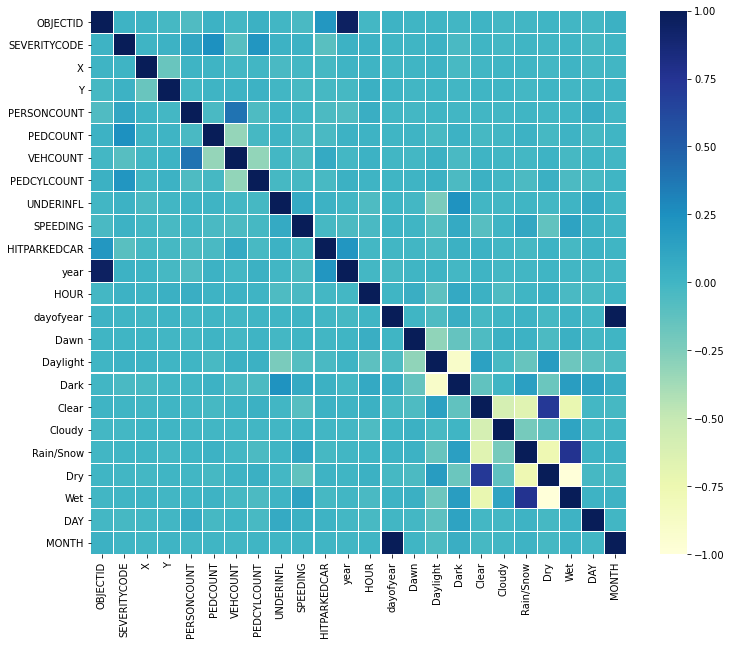

In [15]:

mat =  df_feature.corr()
f, ax = plt.subplots(figsize =(12, 10))
  
sns.heatmap(mat, ax = ax, cmap ="YlGnBu", 
            linewidths = 0.1) 

In [16]:
severity_map = folium.Map(location=[47.619543,-122.330518],
                        zoom_start=13,
                        tiles="CartoDB dark_matter")
df_value = df_feature['PERSONCOUNT'] + df_feature['PEDCOUNT'] + df_feature['PEDCYLCOUNT'] + df_feature['VEHCOUNT']
for i in range(7800,8800):
    lat = df_feature['Y'].iloc[i]
    long = df_feature['X'].iloc[i]
    radius = df_value.iloc[i] / 0.8
    
    if radius > 10:
        color = "#FF4500"
     
    else:
        color = "#008080"
    
    popup_text = """Latitude : {}<br>
                Longitude : {}<br>
                LOCATION : {}<br>
                PEOPLE INVOLVEMENT: {}<br>
                SEVERITY CODE:{}<br>"""
    popup_text = popup_text.format(lat,
                               long,
                               data['LOCATION'].iloc[i],
                               df_value.iloc[i],
                               data['SEVERITYCODE'].iloc[i]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text,radius = radius, color = color, fill = True).add_to(severity_map)
severity_map

In [17]:
m_2 = folium.Map(location=[47.619543,-122.330518], tiles='cartodbdark_matter', zoom_start=12)
HeatMap(data=df_feature[['Y', 'X']], radius=10).add_to(m_2)

m_2

'<h1 font-color='violet' align='center' style="font-family:'Courier New'">Data Analysis
</h1>
<div align='center' style="font-family:'Lucida Console'">
<p>
The first comparison made is the severity against the new date attributes. The
severity code obeys the following,<br>
• 3 - Fatalilty<br>
• 2b - Serious injury<br>
• 2 - Injury<br>
• 1 - Prop damage<br>
• 0 - Unknown<br>
    <br>
The column was analysed to see the count of each severity. The only severity
codes within the dateset are 1 and 2. This allowed for optimising the function of the
code and improve the runtime.<br><br>
First, let’s look at the total number of incidents across the years. This can be seen in
3.1a. This shows a peak at 2006 but then continues to decrease beyond this point.
The number of incidents have effectively halved across the 16 years (neglecting the
peak at 2015). This figure also shows that incidents including injury are a lot less
likely than those of property damage. Suggesting that injuries are very minimal in
Seattle, and decreasing.<br><br>
Equally, the total amount of vehicles involved peaked at the same time (as
expected), and is also decreasing. This will be important to note, as the weather
conditions will affect the amount of vehicles damaged. An interesting observation is
the amount of vehicles involved in incidents is more than that of people involved,
suggesting there are a noticeable amount of stationary, empty vehicles involved in
collisions. An example being a car driving at night in January on black ice, could
swerve and hit multiple parked cars.
<br>


</p>
</div>

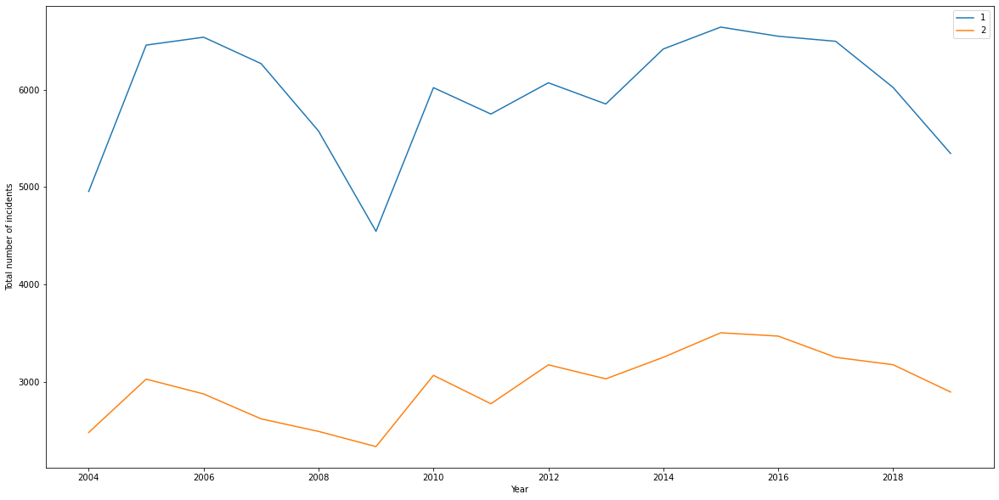

In [18]:
year = np.zeros((16,2))

b = 0
for a in range(2004,2020):

    for m in [1,2]:        
        year[b,m-1] = (np.sum((df_feature['year']== a) & (df_feature['SEVERITYCODE'] == m)))
    b = b + 1
plt.figure(figsize=(20,10))


x=np.arange(2004,2020)

plt.plot(x,year)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=1)
plt.show()

In [19]:
len(df_feature['PERSONCOUNT'].unique())

46

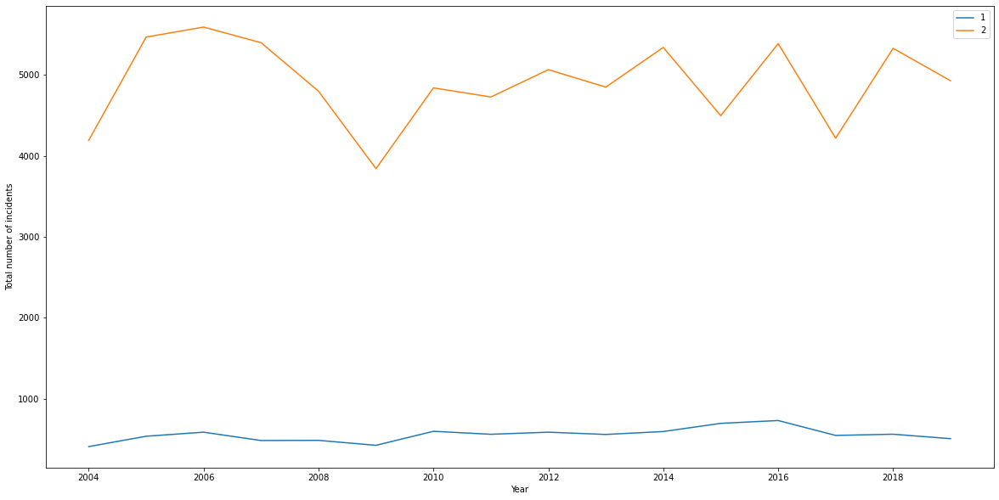

In [20]:
year = np.zeros((16,2))

b = 0
for a in range(2004,2020):

    for m in [1,2]:        
        year[b,m-1] = (np.sum((df_feature['year']== a) & (df_feature['PERSONCOUNT'] == m)))
    b = b + 1
plt.figure(figsize=(20,10))


x=np.arange(2004,2020)

plt.plot(x,year)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=1)
plt.show()

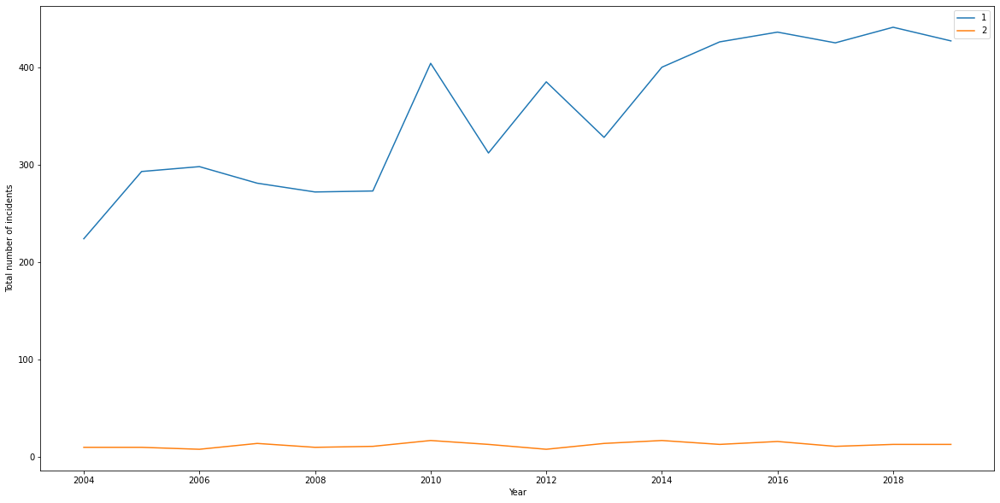

In [21]:
year = np.zeros((16,2))

b = 0
for a in range(2004,2020):

    for m in [1,2]:        
        year[b,m-1] = (np.sum((df_feature['year']== a) & (df_feature['PEDCOUNT'] == m)))
    b = b + 1
plt.figure(figsize=(20,10))


x=np.arange(2004,2020)

plt.plot(x,year)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=1)
plt.show()

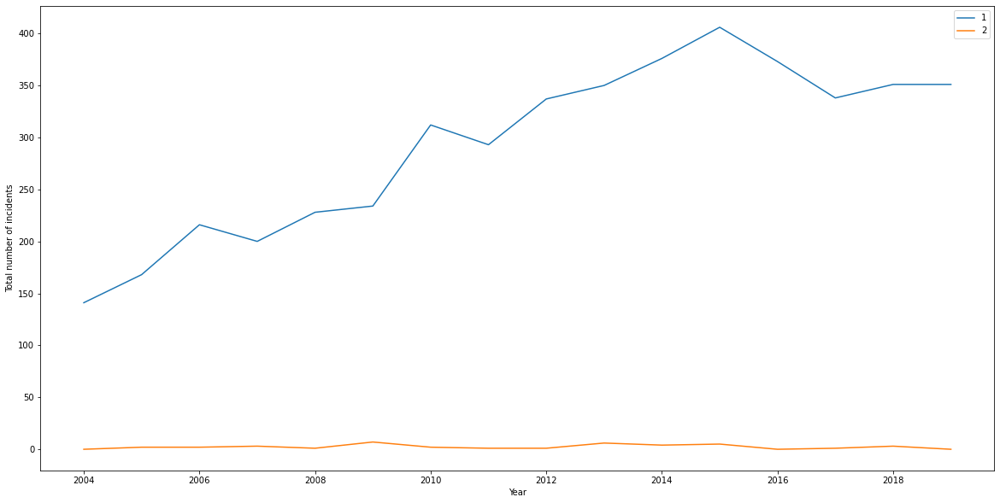

In [22]:
year = np.zeros((16,2))

b = 0
for a in range(2004,2020):

    for m in [1,2]:        
        year[b,m-1] = (np.sum((df_feature['year']== a) & (df_feature['PEDCYLCOUNT'] == m)))
    b = b + 1
plt.figure(figsize=(20,10))


x=np.arange(2004,2020)

plt.plot(x,year)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=1)
plt.show()

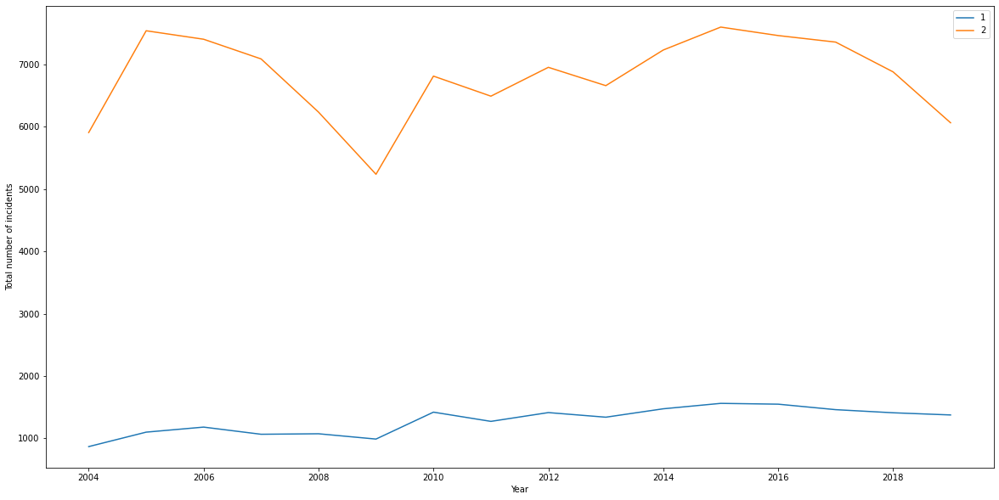

In [23]:
year = np.zeros((16,2))

b = 0
for a in range(2004,2020):

    for m in [1,2]:        
        year[b,m-1] = (np.sum((df_feature['year']== a) & (df_feature['VEHCOUNT'] == m)))
    b = b + 1
plt.figure(figsize=(20,10))


x=np.arange(2004,2020)

plt.plot(x,year)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=1)
plt.show()

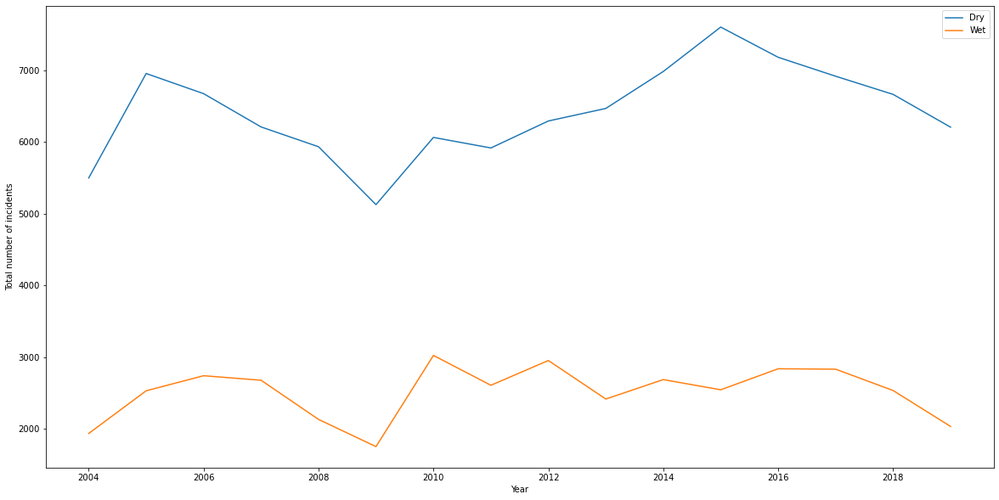

In [24]:
year_array = np.zeros((16,2))

b = 0
for a in range(2004,2020):            
        year_array[b,0] = (np.sum((df_feature['year']== a) & (df_feature['Dry'] == 1)))
        year_array[b,1] = (np.sum((df_feature['year']== a) & (df_feature['Wet'] == 1)))       
        b = b + 1
plt.figure(figsize=(20,10))


x=np.arange(2004,2020)

plt.plot(x,year_array)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['Dry','Wet'],loc=1)
plt.show()

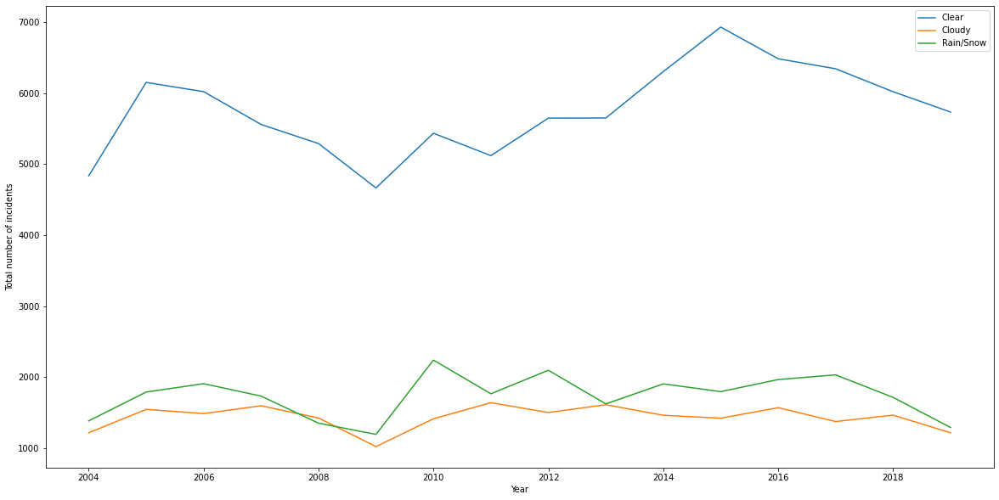

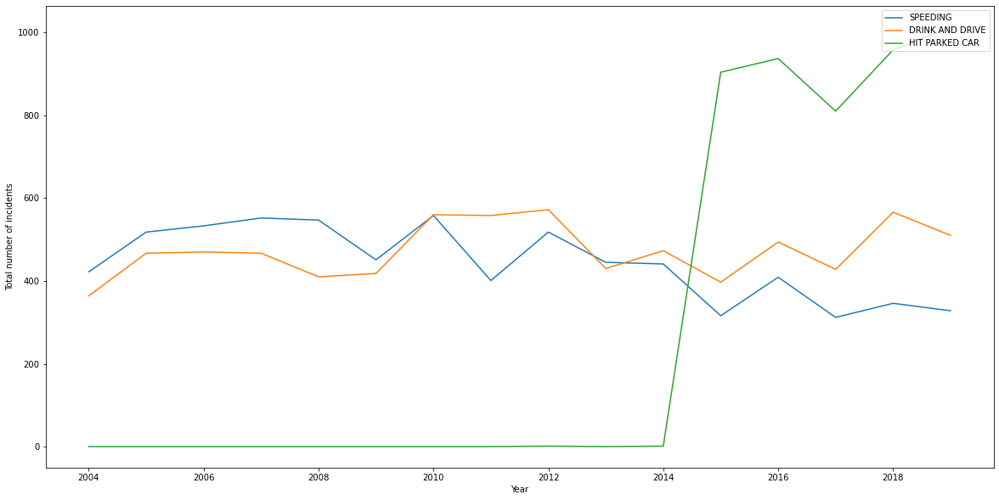

In [25]:
year_array = np.zeros((16,3))

b = 0
for a in range(2004,2020):            
        year_array[b,0] = (np.sum((df_feature['year']== a) & (df_feature['Clear'] == 1)))
        year_array[b,1] = (np.sum((df_feature['year']== a) & (df_feature['Cloudy'] == 1)))
        year_array[b,2] = (np.sum((df_feature['year']== a) & (df_feature['Rain/Snow'] == 1)))
        b = b + 1
plt.figure(figsize=(20,10))

x=np.arange(2004,2020)

plt.plot(x,year_array)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['Clear','Cloudy','Rain/Snow'],loc=1)
plt.show()

year_array = np.zeros((16,3))

b = 0
for a in range(2004,2020):            
        year_array[b,0] = (np.sum((df_feature['year']== a) & (df_feature['SPEEDING'] == 1)))
        year_array[b,1] = (np.sum((df_feature['year']== a) & (df_feature['UNDERINFL'] == 1)))
        year_array[b,2] = (np.sum((df_feature['year']== a) & (df_feature['HITPARKEDCAR'] == 1)))
        b = b + 1
plt.figure(figsize=(20,10))

x=np.arange(2004,2020)

plt.plot(x,year_array)
plt.xlabel('Year')
plt.ylabel('Total number of incidents')
plt.legend(['SPEEDING', 'DRINK AND DRIVE', 'HIT PARKED CAR'],loc=1)
plt.show()

'<h1 font-color='violet' align='center' style="font-family:'Courier New'">Total Incident Per Month
</h1>
<div align='center' style="font-family:'Lucida Console'">
<p>
Having analysed the total amounts across the year, it’s important to also analyse
incidents across the months. From analysis we can see that the amount of incidents
reported are fairly consistent across the months. The drop in incidents occurs in
February, potentially due to fewer drivers on the road. A spike in property damage
8 incidents occurs in October, which could be due to weather, similar to January.
Otherwise, in the Spring/Summer/Autumn months, the number of incidents are
consistent.

</p>
</div>

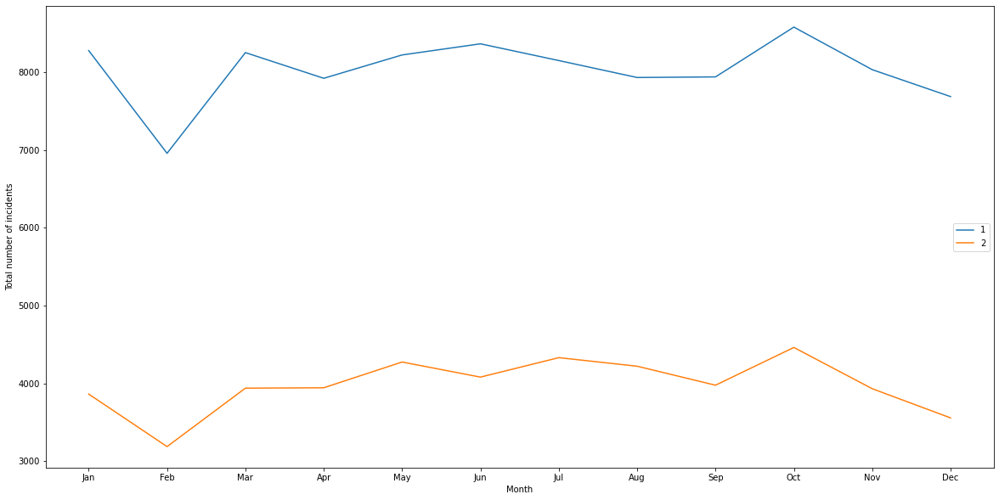

In [26]:
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_array = np.zeros((12,2))

b = 0
for a in range(1,13):

    for m in [1,2]:        
        month_array[b,m-1] = (np.sum((df_feature['MONTH']== a) & (df_feature['SEVERITYCODE'] == m)))
    b = b + 1    
    x = [i for i, _ in enumerate(months)]
plt.figure(figsize=(20,10))

plt.xticks(x, months)

plt.plot(x,month_array)
plt.xlabel('Month')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=5)
plt.show()

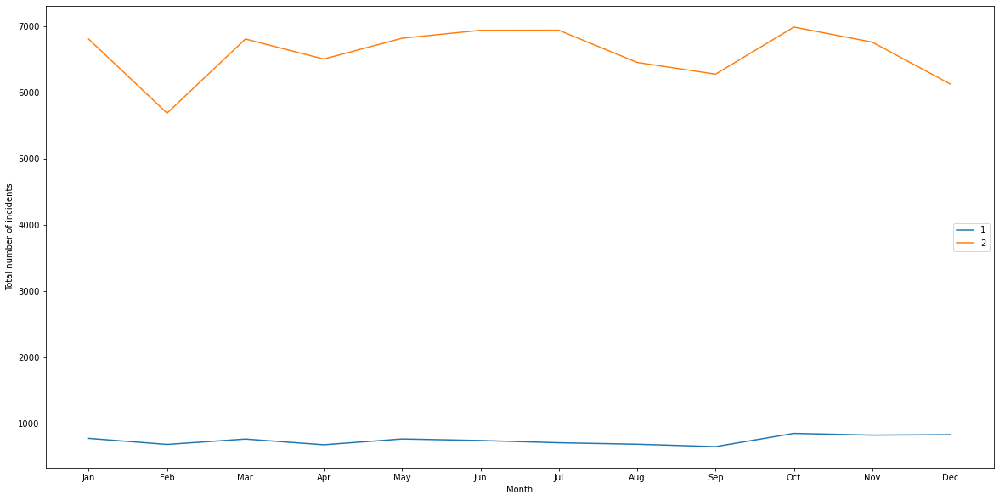

In [27]:
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_array = np.zeros((12,2))

b = 0
for a in range(1,13):

    for m in [1,2]:        
        month_array[b,m-1] = (np.sum((df_feature['MONTH']== a) & (df_feature['PERSONCOUNT'] == m)))
    b = b + 1    
    x = [i for i, _ in enumerate(months)]
plt.figure(figsize=(20,10))

plt.xticks(x, months)

plt.plot(x,month_array)
plt.xlabel('Month')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=5)
plt.show()

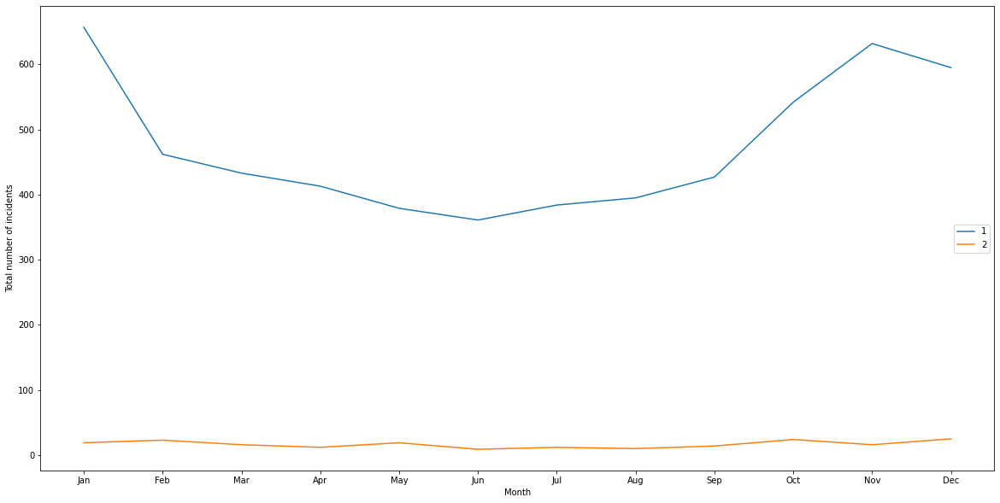

In [28]:
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_array = np.zeros((12,2))

b = 0
for a in range(1,13):

    for m in [1,2]:        
        month_array[b,m-1] = (np.sum((df_feature['MONTH']== a) & (df_feature['PEDCOUNT'] == m)))
    b = b + 1    
    x = [i for i, _ in enumerate(months)]
plt.figure(figsize=(20,10))

plt.xticks(x, months)

plt.plot(x,month_array)
plt.xlabel('Month')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=5)
plt.show()

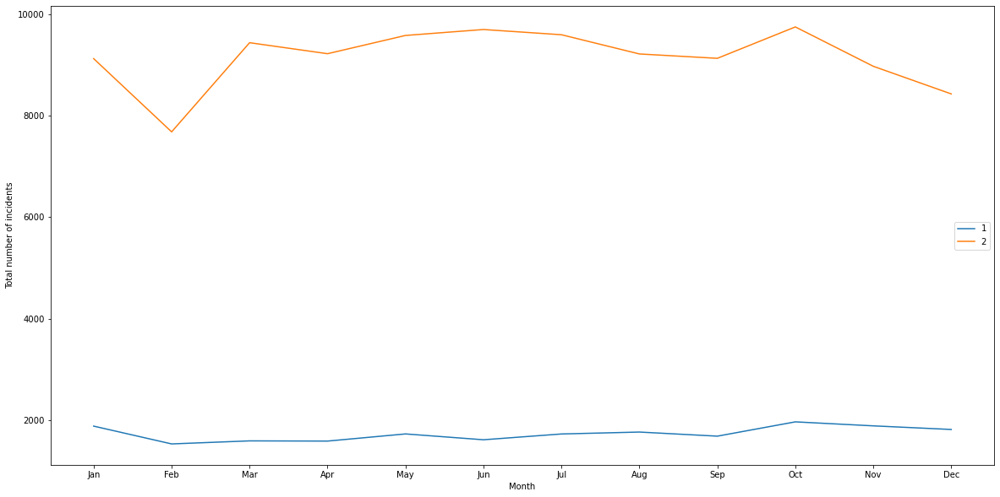

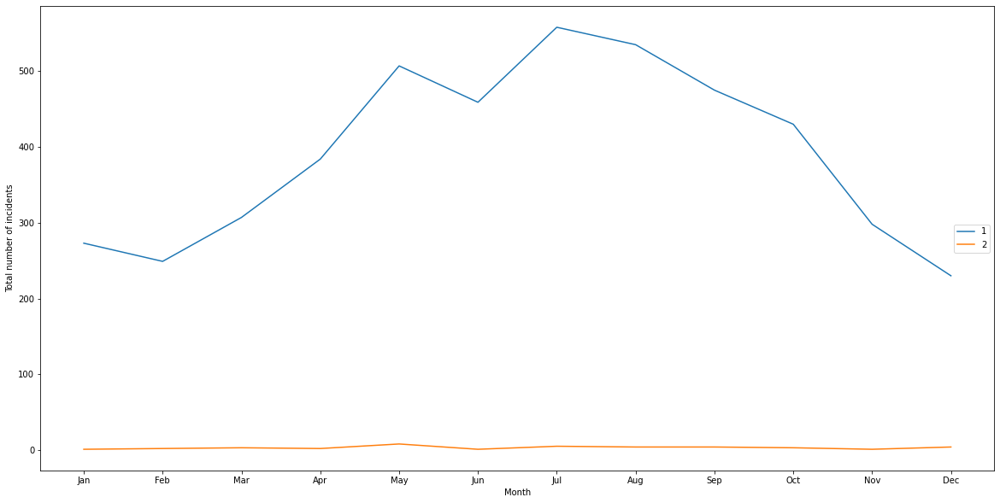

In [29]:
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_array = np.zeros((12,2))

b = 0
for a in range(1,13):

    for m in [1,2]:        
        month_array[b,m-1] = (np.sum((df_feature['MONTH']== a) & (df_feature['VEHCOUNT'] == m)))
    b = b + 1    
    x = [i for i, _ in enumerate(months)]
plt.figure(figsize=(20,10))

plt.xticks(x, months)

plt.plot(x,month_array)
plt.xlabel('Month')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=5)
plt.show()
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_array = np.zeros((12,2))

b = 0
for a in range(1,13):

    for m in [1,2]:        
        month_array[b,m-1] = (np.sum((df_feature['MONTH']== a) & (df_feature['PEDCYLCOUNT'] == m)))
    b = b + 1    
    x = [i for i, _ in enumerate(months)]
plt.figure(figsize=(20,10))

plt.xticks(x, months)

plt.plot(x,month_array)
plt.xlabel('Month')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=5)
plt.show()

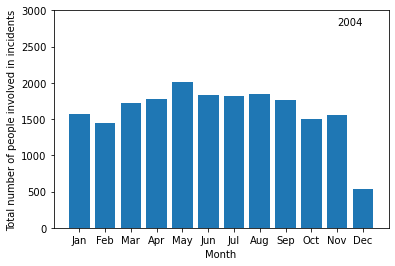

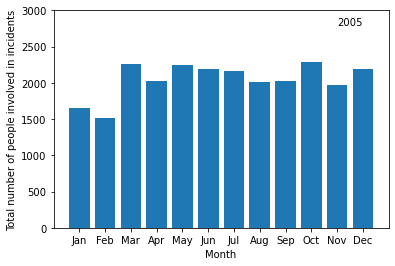

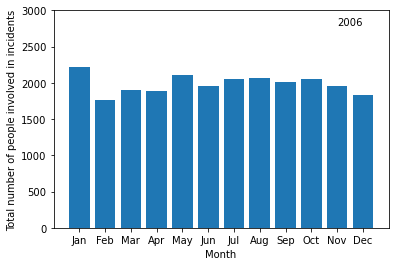

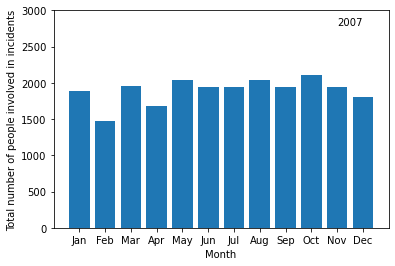

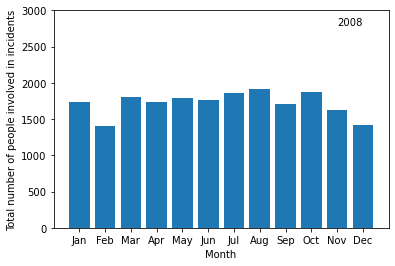

...

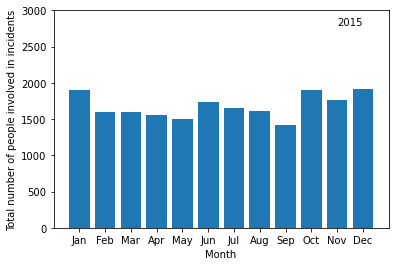

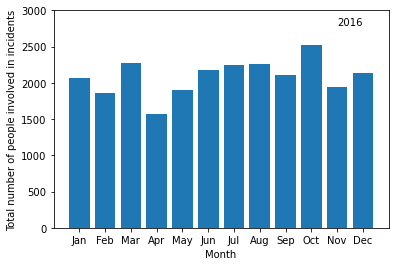

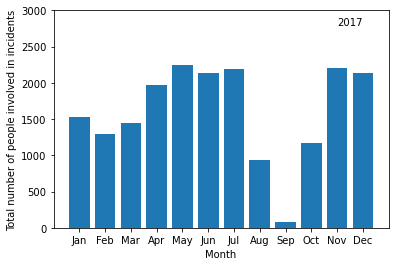

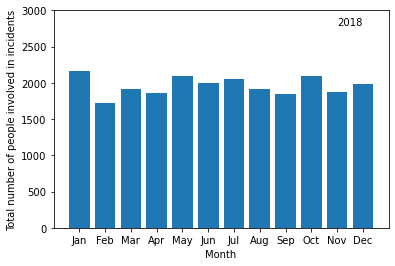

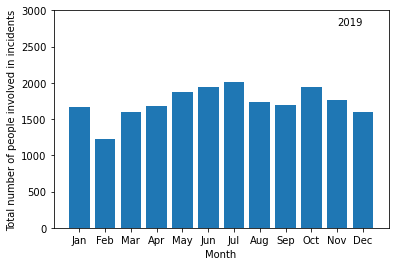

In [30]:
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_array = np.zeros(12)

for b in range(2004,2020,1):
    df_date = df_feature[df_feature['year'] == b] 
    n = 0
    for j in range(1,13):
        month_array[n] = np.sum(df_date['PERSONCOUNT'][df_date['MONTH'] == j])
        n = n + 1
        x = [i for i, _ in enumerate(months)]
    
    plt.figure()
    plt.ylim([0,3000])
    plt.text(10,2800,str(b))    
    plt.xticks(x, months)
    plt.xlabel('Month')
    plt.ylabel('Total number of people involved in incidents')
    plt.bar(x,month_array)
plt.show()

'<h1 font-color='violet' align='center' style="font-family:'Courier New'">Total Incident Per Day
</h1>
<div align='center' style="font-family:'Lucida Console'">
<p>
The property damage incidents occur twice as often as injuries.
What is noticeable is that Christmas day has the least amount of incidents, which is
expected as far fewer people travel on that day. It is noticeable also that days with a
drop in incidents occur around public holidays [11].<br><br>
What is noticeable across is that although the number of incidents involving
property damage reduces across the year, the amount of injuries stays fairly consistent. This could be due to people being more careful on the road to avoid cars
being damaged. 2008 had the highest number of incidents per day.
What was seen in the data however that after this period, the incidents decreased
dramatically. Total incidents per day for year 2019 which had the lowest
incidents has dropped to have more consistent amounts of incidents.

</p>
</div>

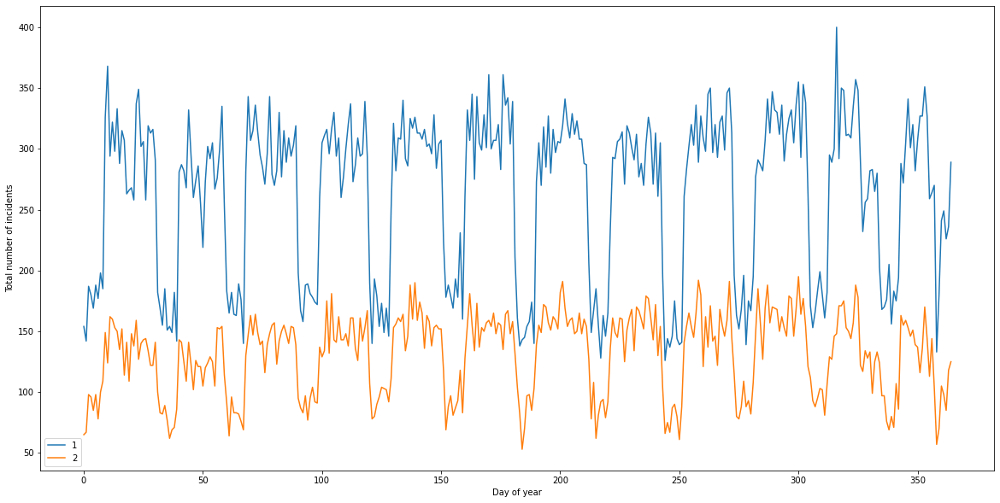

In [31]:
severity_array = np.zeros((2,365))
    
for n in range(365):
    a = 0
    for m in [1,2]:        
        severity_array[a,n] = (np.sum((df_feature['dayofyear']== n+1) & (df_feature['SEVERITYCODE'] == m)))
        a = a + 1
plt.figure(figsize=(20,10))
# plt.ylim([0,400])
# plt.text(175,65,str(b))
for x in range(2):        
    plt.plot(range(365),severity_array[x])
    plt.xlabel('Day of year')
    plt.ylabel('Total number of incidents')
    plt.legend(['1','2'],loc=3)
plt.show()

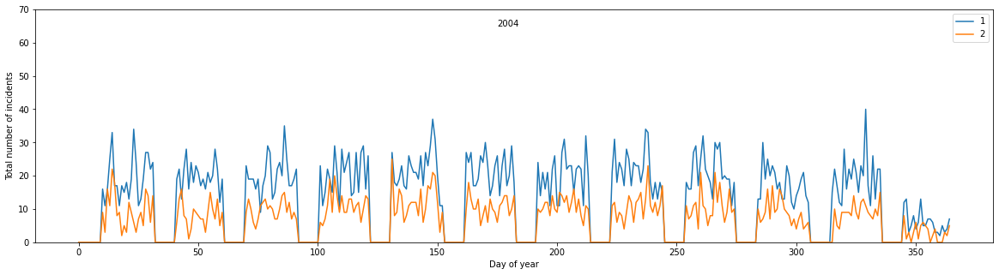

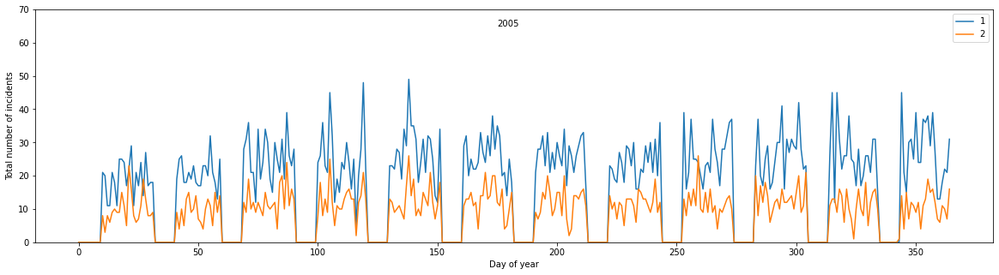

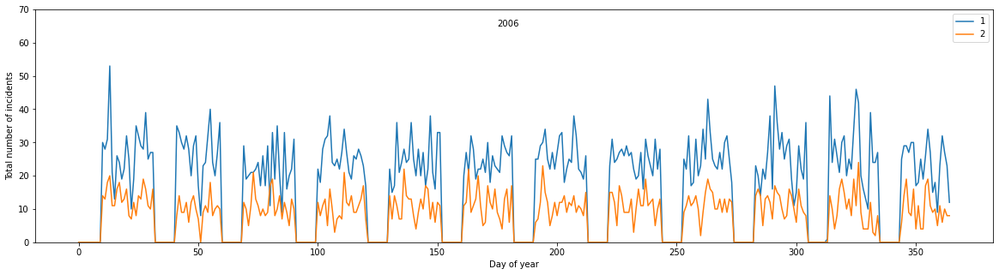

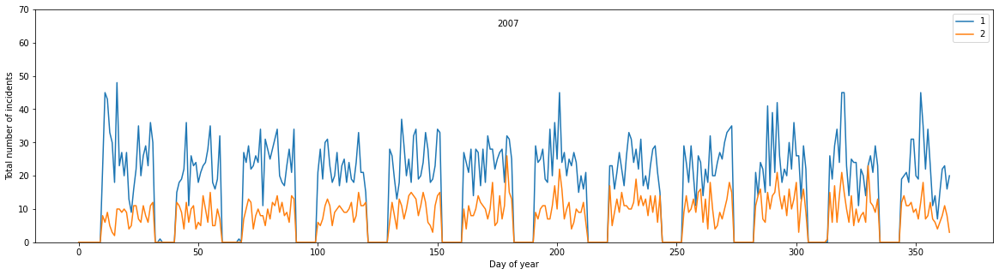

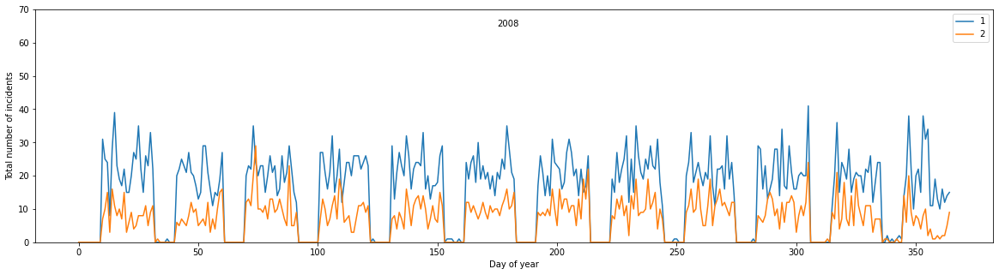

...

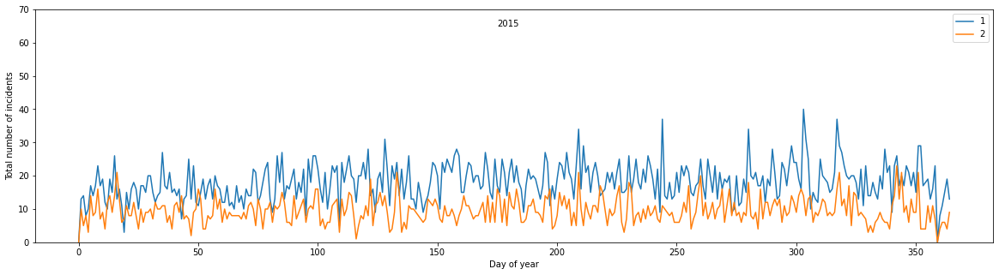

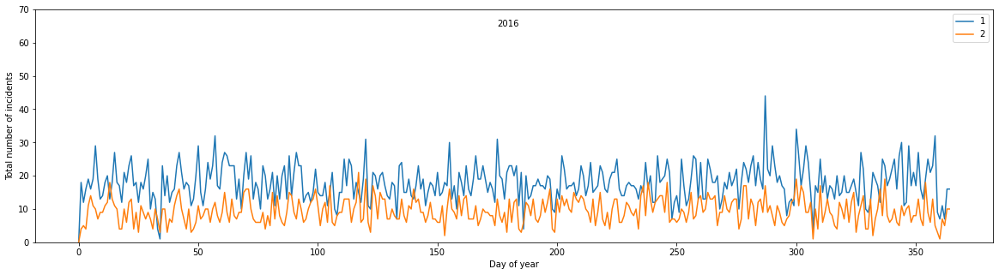

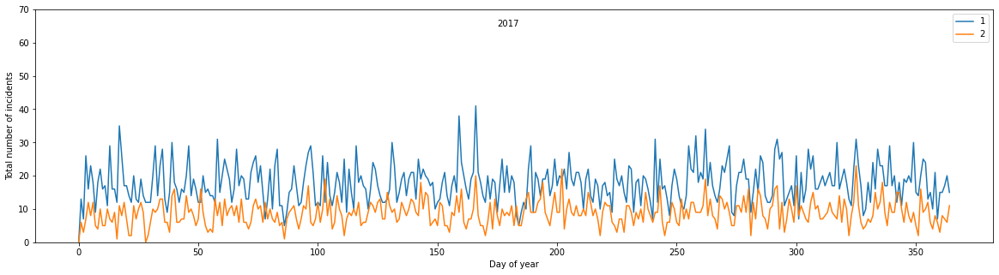

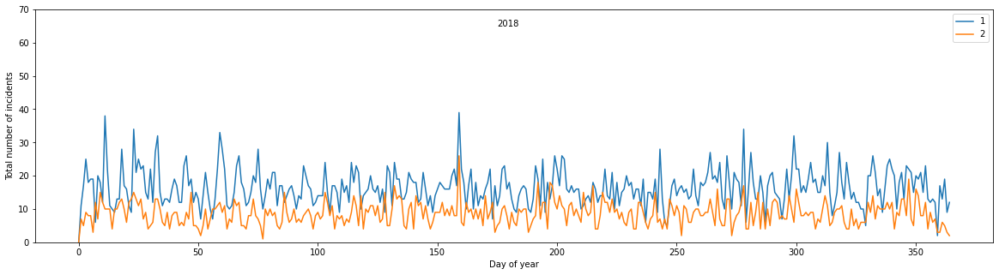

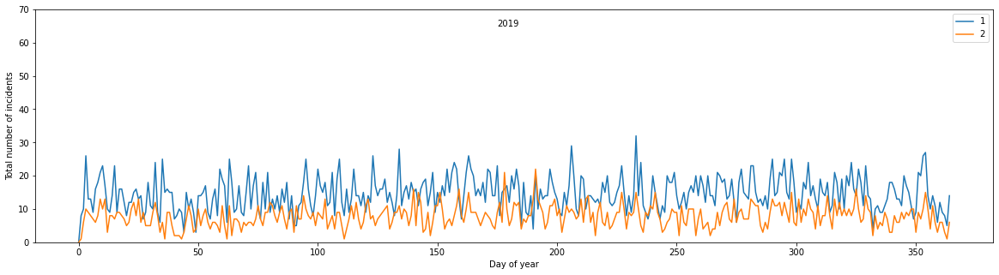

In [32]:
for b in range(2004,2020,1):
    df_date = df_feature[df_feature['year'] == b]
    severity_array = np.zeros((2,365))
    
    for n in range(365):
        a = 0
        for m in [1,2]:        
            severity_array[a,n] = (np.sum((df_date['dayofyear']==n) & (df_date['SEVERITYCODE'] == m)))
            a = a + 1
    plt.figure(figsize=(20,5))
    plt.ylim([0,70])
    plt.text(175,65,str(b))
    for x in range(2):        
        plt.plot(range(365),severity_array[x])
        plt.xlabel('Day of year')
        plt.ylabel('Total number of incidents')
    plt.legend(['1','2'],loc=1)
plt.show()

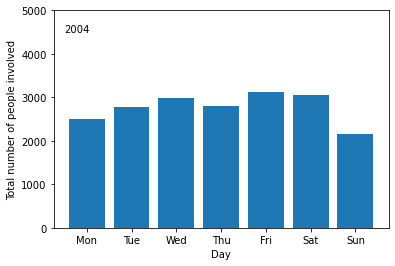

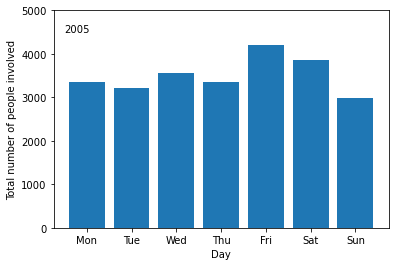

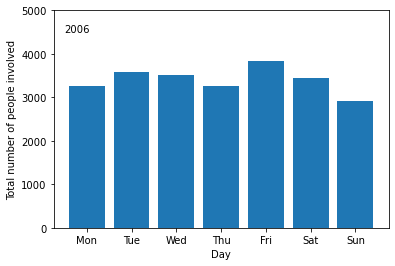

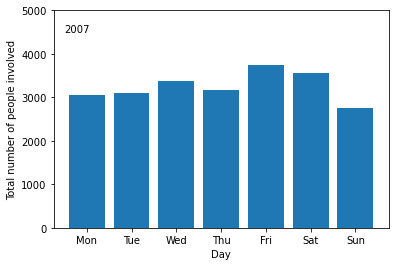

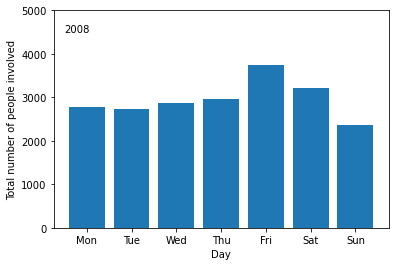

...

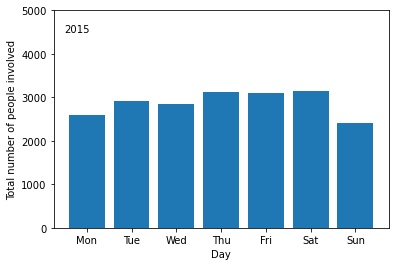

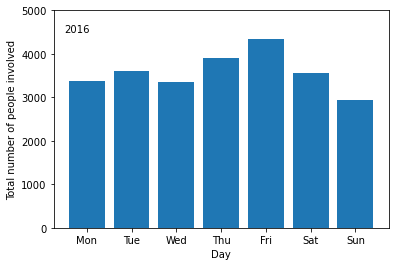

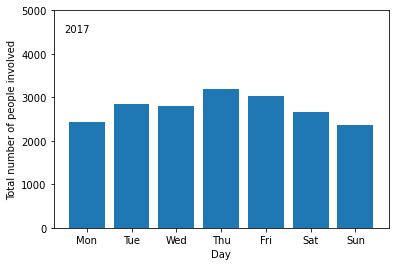

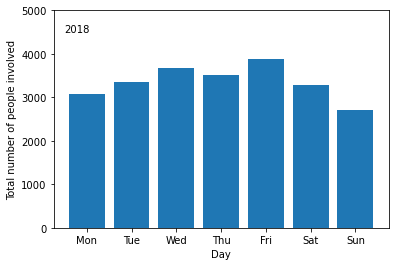

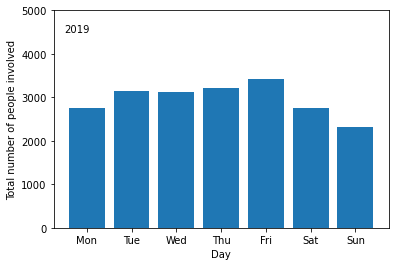

In [33]:
days = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
day_array = np.zeros(7)

for b in range(2004,2020,1):
    df_date = df_feature[df_feature['year'] == b] 
    n = 0
    for a in range(1,8):
        day_array[n] = np.sum(df_date['PERSONCOUNT'][df_date['DAY'] == a])
        n = n + 1
        x = [i for i, _ in enumerate(days)]
    plt.figure()
    plt.ylim([0,5000])
    plt.text(-0.5,4500,str(b))  
    plt.xticks(x, days)
    plt.bar(x,day_array)
    plt.xlabel('Day')
    plt.ylabel('Total number of people involved')
plt.show()

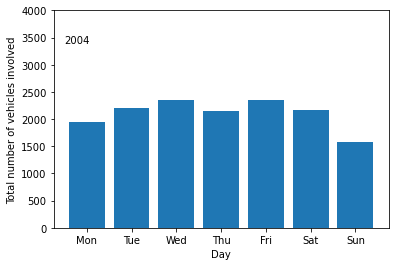

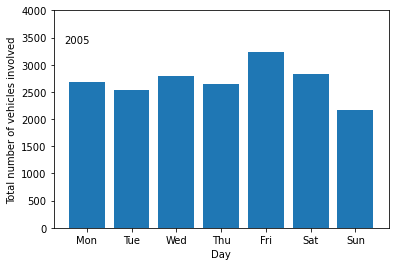

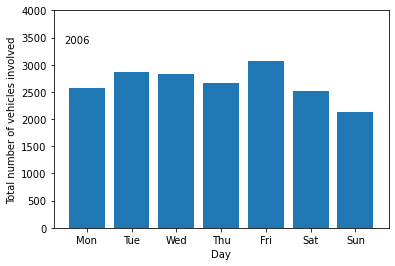

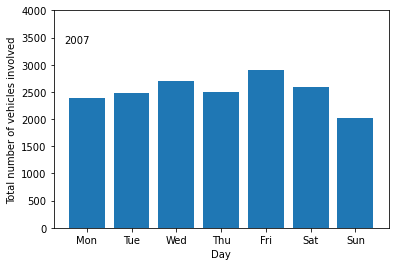

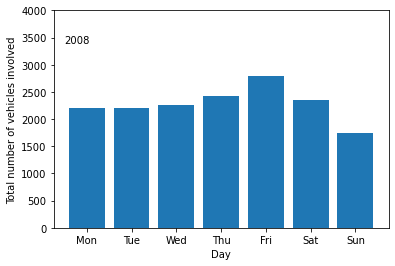

...

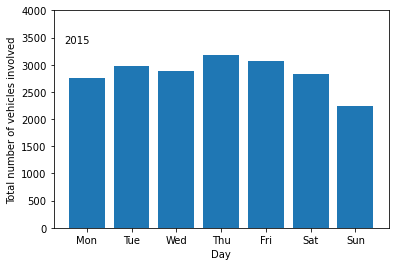

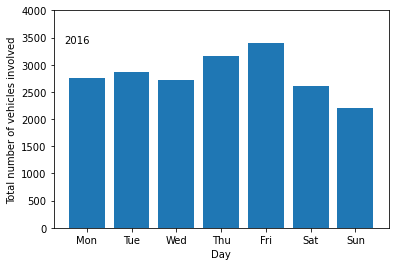

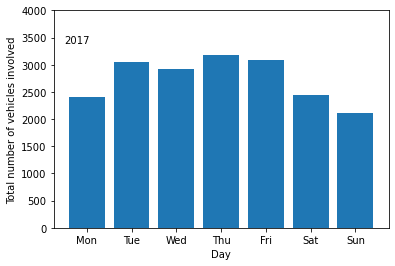

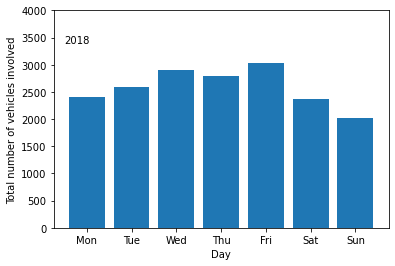

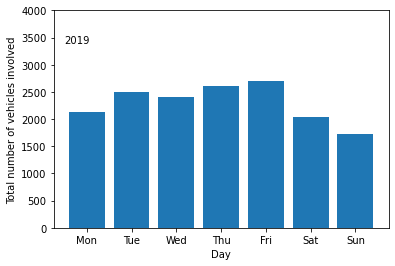

In [34]:
days = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
day_array = np.zeros(7)

for b in range(2004,2020,1):
    df_date = df_feature[df_feature['year'] == b]
    n = 0
    for a in range(1,8):
        day_array[n] = np.sum(df_date['VEHCOUNT'][df_date['DAY'] == a])
        n = n + 1
        x = [i for i, _ in enumerate(days)]
    plt.figure()
    plt.ylim([0,4000])
    plt.text(-0.5,3400,str(b))
    plt.xticks(x, days)
    plt.bar(x,day_array)
    plt.xlabel('Day')
    plt.ylabel('Total number of vehicles involved')
plt.show()

![](https://miro.medium.com/max/700/0*XjpMvUSYJ91EpFVz)
<h1 font-color='violet' align='center' style="font-family:'Courier New'">Total Incident Per Hour
</h1>
<div align='center' style="font-family:'Lucida Console'">
<p>
Finally, let’s look at the total number of incidents across time.the amount of incidents drops between 2am and 6am. This is expected as
most people will be sleeping during these hours. The incidents peak at 5pm, which
would be rush hour. This suggests that travelling later in the day could reduce
the likelihood of an incident occurring.property damage has no
correlation to time. Otherwise, these graphs suggest that there is a correlation in
number of incidents and number of people involved at peak times.

</p>
</div>

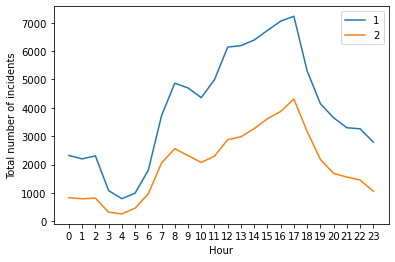

In [35]:
hour_array = np.zeros((24,2))
times = np.arange(0,24,1)
b = 0
for a in range(0,24):

    for m in [1,2]:        
        hour_array[b,m-1] = (np.sum((df_feature['HOUR']== a) & (df_feature['SEVERITYCODE'] == m)))
    b = b + 1
    x = [i for i, _ in enumerate(times)]
plt.figure()


plt.plot(x,hour_array)
plt.xticks(x, times)
plt.xlabel('Hour')
plt.ylabel('Total number of incidents')
plt.legend(['1','2'],loc=1)
plt.show()

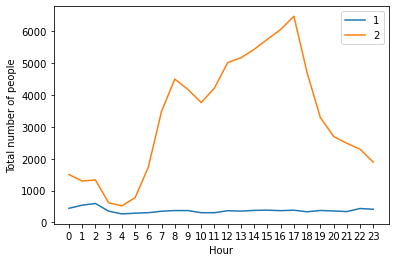

In [36]:
hour_array = np.zeros((24,2))
times = np.arange(0,24,1)
b = 0
for a in range(0,24):

    for m in [1,2]:        
        hour_array[b,m-1] = (np.sum((df_feature['HOUR']== a) & (df_feature['PERSONCOUNT'] == m)))
    b = b + 1
    x = [i for i, _ in enumerate(times)]
plt.figure()



plt.plot(x,hour_array)
plt.xticks(x, times)
plt.xlabel('Hour')
plt.ylabel('Total number of people')
plt.legend(['1','2'],loc=1)
plt.show()

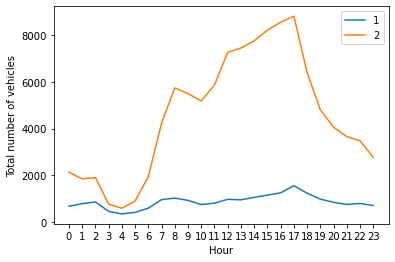

In [37]:
hour_array = np.zeros((24,2))
times = np.arange(0,24,1)
b = 0
for a in range(0,24):

    for m in [1,2]:        
        hour_array[b,m-1] = (np.sum((df_feature['HOUR']== a) & (df_feature['VEHCOUNT'] == m)))
    b = b + 1
    x = [i for i, _ in enumerate(times)]
plt.figure()



plt.plot(x,hour_array)
plt.xticks(x, times)
plt.xlabel('Hour')
plt.ylabel('Total number of vehicles')
plt.legend(['1','2'],loc=1)
plt.show()

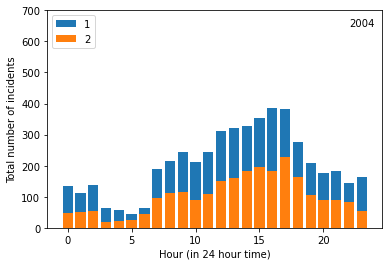

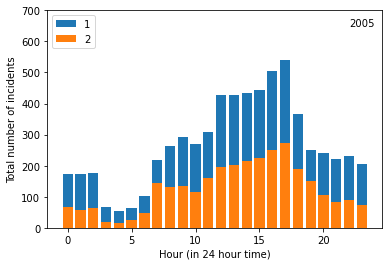

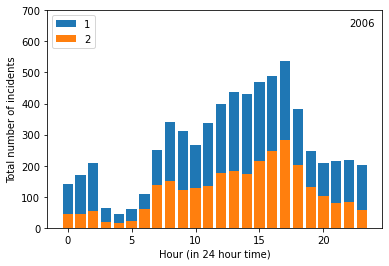

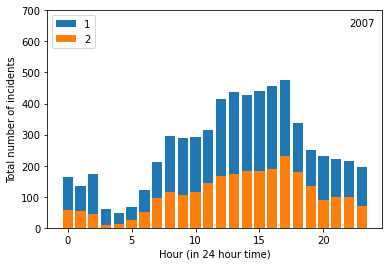

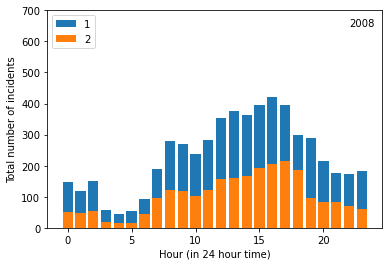

...

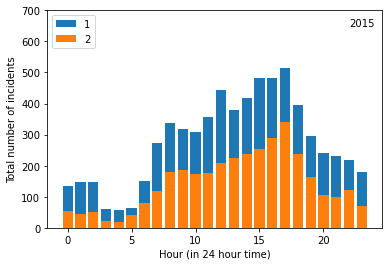

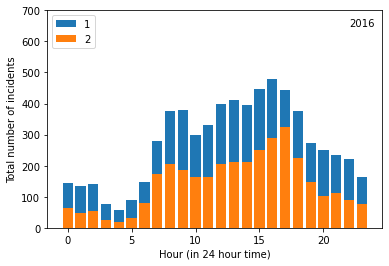

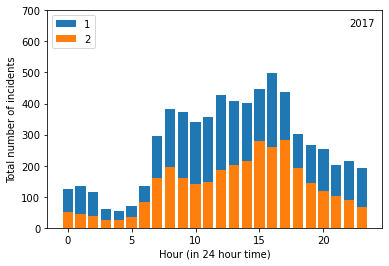

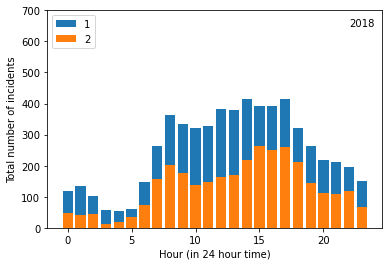

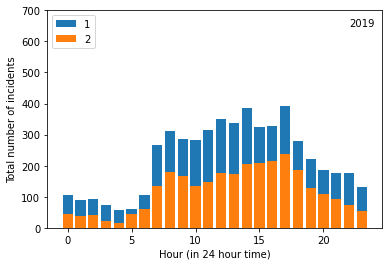

In [38]:
for b in range(2004,2020,1):
    df_time= df_feature[df_feature['year'] == b] #can change year
    severity_array = np.zeros((2,24))
    
    for n in range(24):
        a = 0
        for m in [1,2]:        
            severity_array[a,n] = (np.sum((df_time['HOUR']==n) & (df_time['SEVERITYCODE'] == m)))
            a = a + 1
    plt.figure()
    plt.ylim([0,700])
    plt.text(22,650,str(b))
    for x in range(2):        
        plt.bar(range(24),severity_array[x])
        plt.xlabel('Hour (in 24 hour time)')
        plt.ylabel('Total number of incidents')
    plt.legend(['1','2'],loc=2)
plt.show()

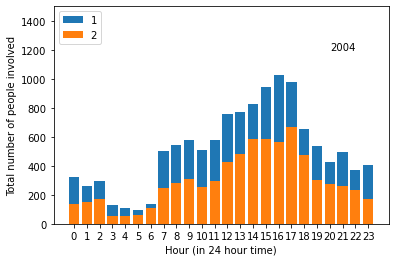

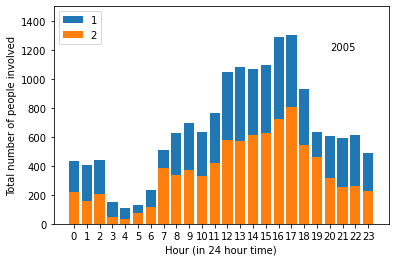

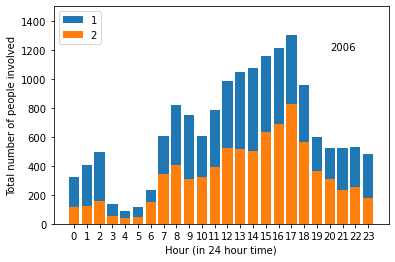

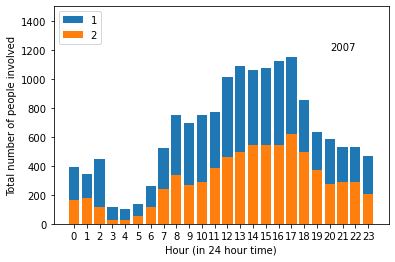

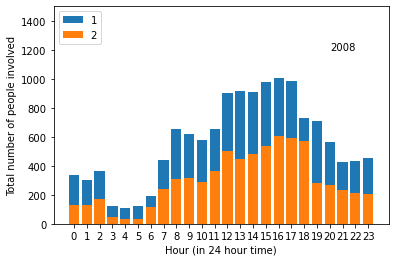

...

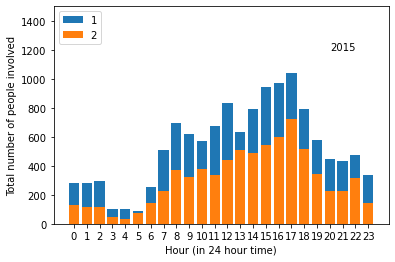

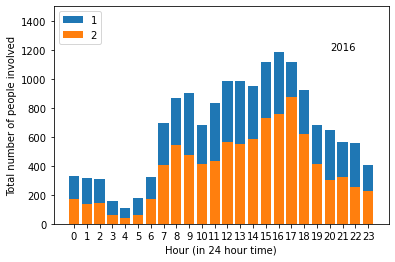

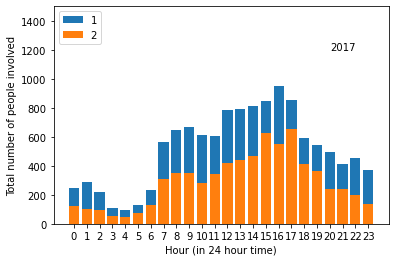

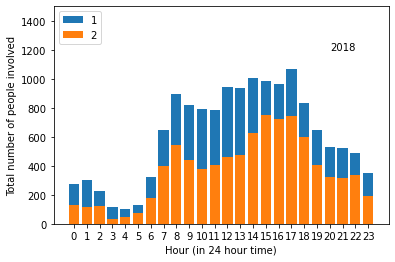

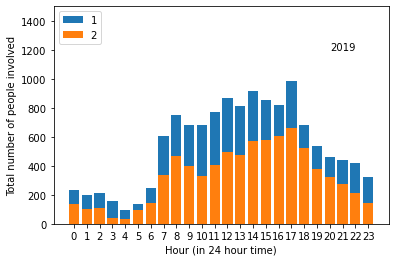

In [39]:
times = np.arange(0,24,1)
time_array = np.zeros((2,24))

for b in range(2004,2020,1):
    df_time = df_feature[df_feature['year'] == b] 
    n = 0
    for a in times:
        for m in [1,2]:
            time_array[m-1,n] = np.sum(df_time['PERSONCOUNT'][df_time['HOUR'] == a][df_time['SEVERITYCODE'] == m])
        n = n + 1
        x = [i for i, _ in enumerate(times)]
    plt.figure()
    plt.ylim([0,1500])
    plt.text(20,1200,str(b))
    plt.xticks(x, times)
    for i in range(2):
        plt.bar(x,time_array[i])
    plt.legend(['1','2'],loc=2)
    plt.xlabel('Hour (in 24 hour time)')
    plt.ylabel('Total number of people involved')
plt.show()

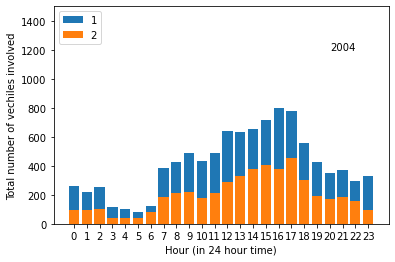

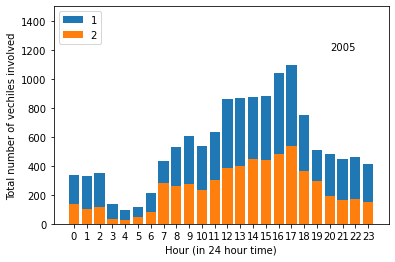

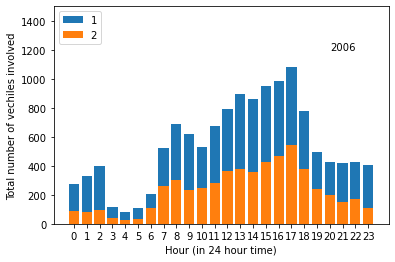

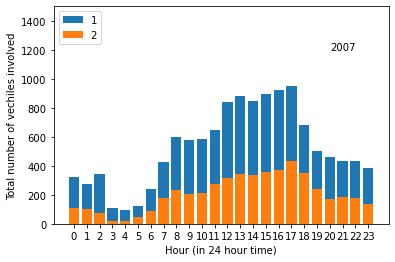

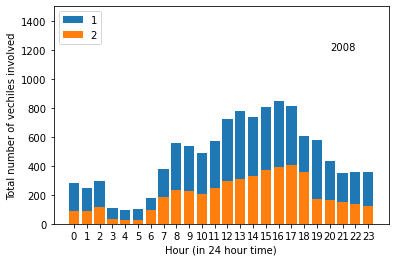

...

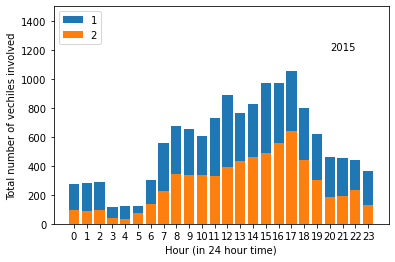

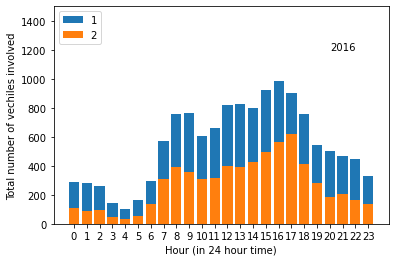

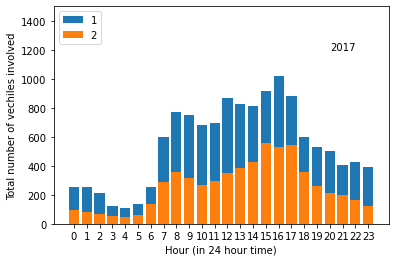

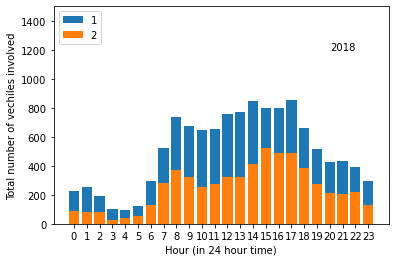

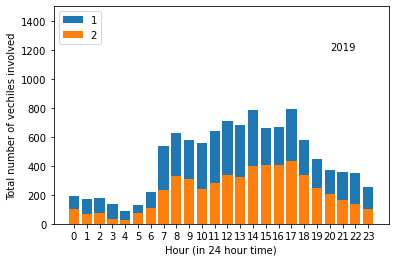

In [40]:
times = np.arange(0,24,1)
time_array = np.zeros((2,24))

for b in range(2004,2020,1):
    df_time = df_feature[df_feature['year'] == b] 
    n = 0
    for a in times:
        for m in [1,2]:
            time_array[m-1,n] = np.sum(df_time['VEHCOUNT'][df_time['HOUR'] == a][df_time['SEVERITYCODE'] == m])
        n = n + 1
        x = [i for i, _ in enumerate(times)]
    plt.figure()
    plt.ylim([0,1500])
    plt.text(20,1200,str(b))
    plt.xticks(x, times)
    for i in range(2):
        plt.bar(x,time_array[i])
    plt.legend(['1','2'],loc=2)
    plt.xlabel('Hour (in 24 hour time)')
    plt.ylabel('Total number of vechiles involved')
plt.show()

<h1 font-color='violet' align='center' style="font-family:'Courier New'">Predictive Modelling</h1>
<div align='center' style="font-family:'Lucida Console'">
<p>
As data contain outliers so by using Robust Scaler data can remove outliers and process and scale the data according to outliers. <br><br>
The machine learning models used are Logistic Regression, K-Nearest Neighbor (KNN), SGD classifier and Random Forest. The logistic regression model is the basic one to predict the binary outcome using a logistic function. KNN uses a non-parametric method to classify new items based on similarity measures (distance).<br><br>
Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks that operate by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. Random decision forests correct for decision trees' habit of overfitting to their training set. Random forests generally outperform decision trees, but their accuracy is lower than gradient boosted trees. However, data characteristics can affect their performance.<br><br>
    Stochastic Gradient Descent (SGD) is a simple yet efficient optimization algorithm used to find the values of parameters/coefficients of functions that minimize a cost function. In other words, it is used for discriminative learning of linear classifiers under convex loss functions such as SVM and Logistic regression. It has been successfully applied to large-scale datasets because the update to the coefficients is performed for each training instance, rather than at the end of instances.

</p>
</div>

In [41]:
from sklearn.preprocessing import RobustScaler

scale = RobustScaler()
df_feature[['PERSONCOUNT','VEHCOUNT','PEDCYLCOUNT','PEDCOUNT']] = scale.fit_transform(df_feature[['PERSONCOUNT','VEHCOUNT','PEDCYLCOUNT','PEDCOUNT']])
df_feature.head()

,OBJECTID,SEVERITYCODE,X,Y,PERSONCOUNT,PEDCOUNT,VEHCOUNT,PEDCYLCOUNT,UNDERINFL,SPEEDING,...,Dawn,Daylight,Dark,Clear,Cloudy,Rain/Snow,Dry,Wet,DAY,MONTH
0,1,2,-122.323148,47.703140,0.0,0.0,0.0,0.0,0,0,...,0,1,0,0,1,0,0,1,3.0,3.0
1,2,1,-122.347294,47.647172,0.0,0.0,0.0,0.0,0,0,...,0,0,1,0,0,1,0,1,3.0,12.0
2,3,1,-122.334540,47.607871,2.0,0.0,1.0,0.0,0,0,...,0,1,0,0,1,0,1,0,4.0,11.0
3,4,1,-122.334803,47.604803,1.0,0.0,1.0,0.0,0,0,...,0,1,0,1,0,0,1,0,5.0,3.0
4,5,2,-122.306426,47.545739,0.0,0.0,0.0,0.0,0,0,...,0,1,0,0,0,1,0,1,3.0,1.0


In [42]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
y = df_feature['SEVERITYCODE'].values
x = df_feature.loc[:,df_feature.columns!= 'SEVERITYCODE']
x = preprocessing.StandardScaler().fit(x).transform(x)


x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

In [43]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
sgd = SGDClassifier(loss='modified_huber',shuffle=True,random_state=101)
sgd.fit(x_train,y_train)
y_pred = sgd.predict(x_test)
score1 = accuracy_score(y_test, y_pred)
f1_score1 = f1_score(y_test, y_pred, average='weighted')
score1

0.7152970571904498

In [44]:
from sklearn.linear_model import LogisticRegression
lgr = LogisticRegression()
lgr.fit(x_train,y_train)
y_pred = lgr.predict(x_test)
score2 = accuracy_score(y_test, y_pred)
f1_score2 = f1_score(y_test, y_pred, average='weighted')
score2

0.7248056635202665

In [45]:
from sklearn.neighbors import KNeighborsClassifier

neigh = KNeighborsClassifier(n_neighbors=14).fit(x_train, y_train)
y_pred = neigh.predict(x_test)
score3 = accuracy_score(y_test, y_pred)
f1_score3 = f1_score(y_test, y_pred, average='weighted')
score3

0.7191837867851194

In [46]:
# from sklearn.tree import DecisionTreeClassifier
# import matplotlib.image as mpimg
# from sklearn import tree

# modeltree = DecisionTreeClassifier(criterion="entropy")
# modeltree.fit(x_train, y_train)


# predTree = modeltree.predict(x_test)
# print(predTree[0:5])
# print(y_test[0:5])
# accuracy_score(y_test,predTree)

In [47]:
from sklearn.ensemble import  RandomForestClassifier
rfm = RandomForestClassifier(n_estimators = 160, random_state = 101, min_samples_leaf=30)
rfm.fit(x_train,y_train)
y_pred = rfm.predict(x_test)
score4 = accuracy_score(y_test, y_pred)
f1_score4 = f1_score(y_test, y_pred, average='weighted')
score4

0.7278942254303165

<h1 font-color='violet' align='center' style="font-family:'Courier New'">Result of Predictive Modelling</h1>

In [48]:
scores = [score1, score2, score3, score4]
f1_scores = [f1_score1,f1_score2,f1_score3,f1_score4]
algorithms = ['SGDClassifier', 'Logistic Regression', 'KNN', 'Random Forest']
df = pd.DataFrame(scores, index=['SGDClassifier', 'Logistic Regression', 'KNN', 'Random Forest'])
df.columns = ['Accuracy']
df['f1_scores'] = f1_scores
df.columns.name = 'Algorithm'
df

Algorithm,Accuracy,f1_scores
SGDClassifier,0.715297,0.680553
Logistic Regression,0.724806,0.668367
KNN,0.719184,0.673489
Random Forest,0.727894,0.673298


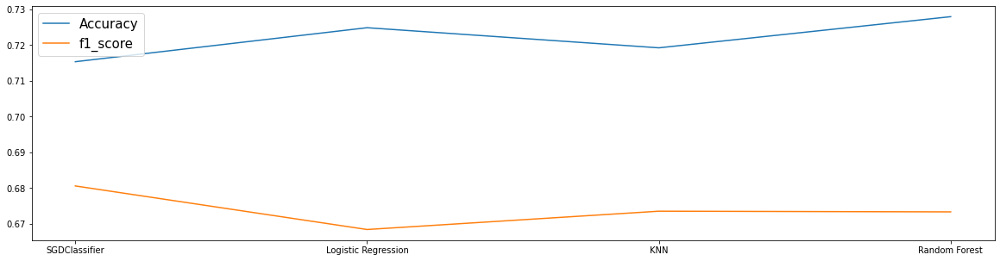

In [49]:
plt.figure(figsize=(20,5))
plt.plot(algorithms, scores)
plt.plot(algorithms,f1_scores)
plt.legend(['Accuracy','f1_score'],loc=2,prop={"size":15})
plt.show()